In [1]:
import anndata as ad
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import scvi

from external_utils import perform_label_transfer

from utils import enrich, enrichr

Global seed set to 0


In [2]:
sc.set_figure_params(dpi=100, frameon=False, color_map='Reds', facecolor=None)
sc.logging.print_header()

/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/numba/core/cpu.py:78: UserWarning: Numba extension module 'sparse._numba_extension' failed to load due to 'ModuleNotFoundError(No module named 'numba.targets')'.
  numba.core.entrypoints.init_all()
2023-02-20 09:57:38.322652: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2023-02-20 09:57:38.322715: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory
2023-02-20 09:57:38.322720: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above ar

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.23.3 scipy==1.10.0 pandas==1.5.0 scikit-learn==1.1.2 statsmodels==0.13.2 python-igraph==0.10.3 pynndescent==0.5.7


In [13]:
def run_scanvi_on_gene_subset(adata, external, batch_key, labels_key, train=True):
    """Combine two adatas and integrate with scanvi on pre-defined marker genes.
    
    Params
    ------
    adata
        Contains `marker_genes` in .var and `source` in .obs.
    external
        Another adata with `source` in .obs.
    batch_key
        Key in `.obs` indicating batch variable, in both adata.
    
    Returns the fit scanvi model and the processed datasets
    """
    # match genes
    overlap = list(set(external.var_names) & set(adata.var_names))
    external = external[:, overlap]
    adata = adata[:, overlap]
    
    full = ad.concat([adata[:, adata.var['marker_genes']], external[:, adata.var['marker_genes']]])
    sc.pp.normalize_total(full, target_sum=1e4)
    print('combined adata of shape:', full.shape)

    # set unknown label for scanvi
    full.obs["responsive_scanvi"] = 'Unknown'
    covid_idx = full.obs['source'] == "ALI"
    full.obs["responsive_scanvi"][covid_idx] = adata.obs[labels_key]
    
    scvi.model.SCANVI.setup_anndata(
        full,
        'responsive_scanvi',
        'Unknown',
        layer="counts",
        batch_key=batch_key
    )

    arches_params = dict(
        use_layer_norm="both",
        use_batch_norm="none",
        encode_covariates=True,
        dropout_rate=0,
        n_layers=2,
        n_latent=30,
    )
    
    lvae_lr = scvi.model.SCANVI(full, **arches_params)

    if train:
        lvae_lr.train(early_stopping=True, max_epochs=10)

        pd.concat(lvae_lr.history.values(), axis=1).reset_index().plot('epoch', ['train_loss_epoch', 'reconstruction_loss_train', 'reconstruction_loss_validation', 'elbo_train', 'elbo_validation'])
        plt.legend(bbox_to_anchor=(1, 1.05))
        plt.show()

    return lvae_lr, full

#### Fit linear classifier

In [4]:
adata = sc.read('2301_annot_patient_integrated_ambient_removed.h5ad')
adata.obs['source'] = 'ALI'

In [5]:
%%time
resp_clusters = ['19', '22']
adata.obs['responsive_cluster'] = adata.obs.leiden.isin(resp_clusters).values.astype(str)
subset = adata

from sklearn.linear_model import LogisticRegression
clf = LogisticRegression()
clf.fit(subset.X, subset.obs.leiden.isin(resp_clusters).values)

CPU times: user 5min 17s, sys: 15min 16s, total: 20min 34s
Wall time: 1min 51s


/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [6]:
clf.score(subset.X, subset.obs.leiden.isin(resp_clusters).values)  # overfit?

0.9936588963123567

Text(0.5, 1.0, 'LR weights, infection classif')

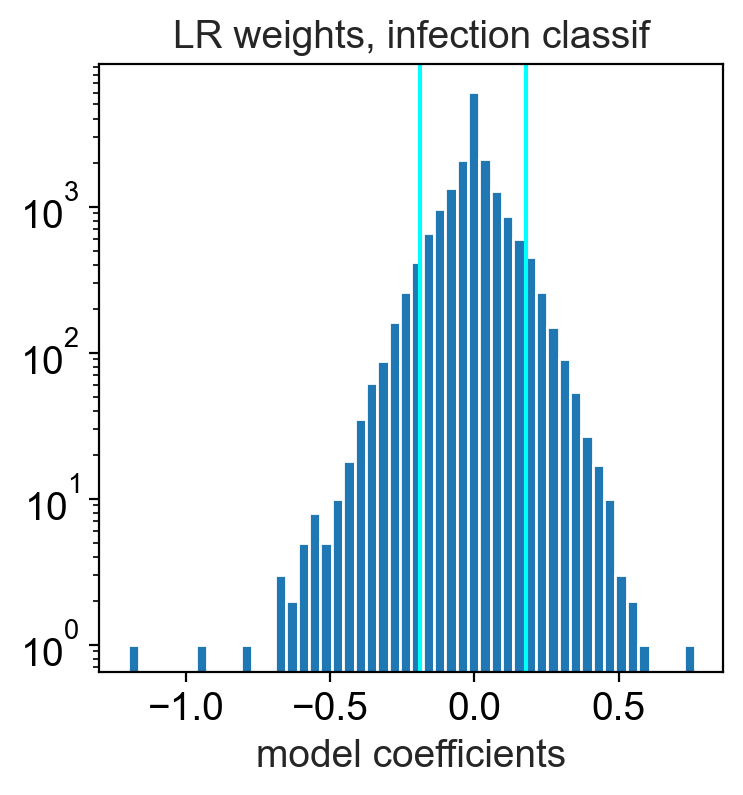

In [7]:
from external_utils import define_marker_genes

define_marker_genes(adata, clf, n_markers=2000)
plt.title('LR weights, infection classif')

In [8]:
subset = adata[adata.obs.patient.isin(['Patient 1', 'Patient 2'])]
sc.tl.rank_genes_groups(subset, groupby='responsive_cluster', method='wilcoxon')

/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


In [9]:
df = sc.get.rank_genes_groups_df(subset, group='True')
genes = df[df.logfoldchanges > 2].names.values

In [53]:
enrich(genes[:20], adata.var_names).head(5)

,name,p_value,intersections
0,tissue development,0.008046,"[CST6, VIM, MAP1B, TGFB1I1, PDGFB, WNT7A, KRT8..."
1,regulation of cell differentiation,0.008046,"[FSTL3, MAP1B, TGFB1I1, SPOCK2, PDGFB, WNT7A, ..."
2,epithelium development,0.008046,"[VIM, MAP1B, TGFB1I1, PDGFB, WNT7A, KRT81, SER..."
3,cell differentiation,0.010890,"[VIM, FSTL3, MAP1B, TSPAN2, TGFB1I1, NEXN, SPO..."
4,negative regulation of cell differentiation,0.010890,"[FSTL3, TGFB1I1, PDGFB, WNT7A, INHBA, RFLNB]"


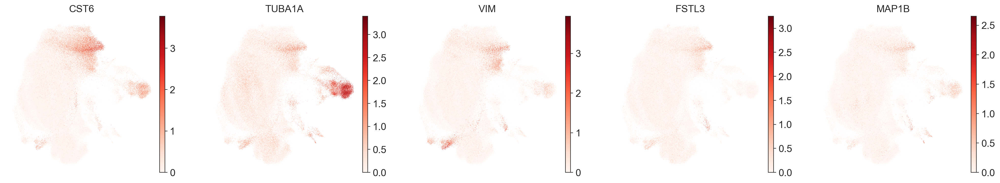

In [45]:
sc.pl.umap(adata, color=genes[:5], cmap='Reds', ncols=5)

/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


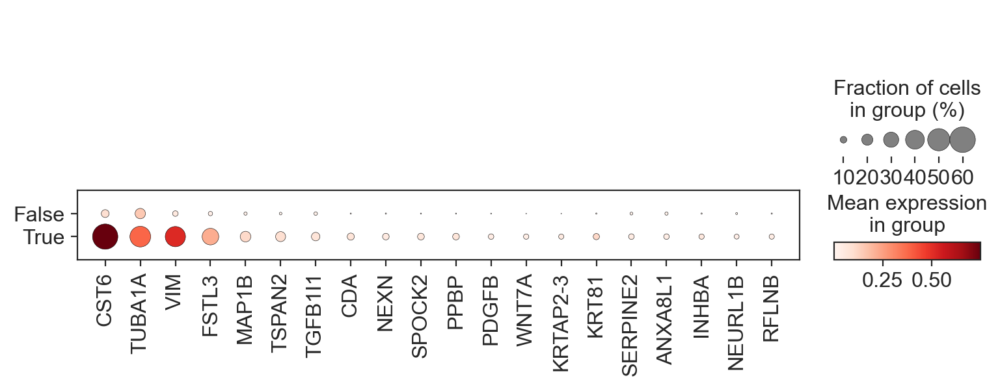

In [54]:
sc.pl.dotplot(adata, groupby='responsive_cluster', var_names=genes[:20])

## integrate with IPF atlas

In [60]:
ipf = sc.read('IPF_atlas_epithelium_only.h5ad')
ipf = ipf[~ipf.obs.cell_type.isin(['AT1', 'AT2'])]
adata.obs['data_set'] = 'ALI'
ipf.obs['source'] = 'IPF'

/tmp/ipykernel_1895726/3951134975.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ipf.obs['source'] = 'IPF'


In [11]:
%%time
sc.pp.neighbors(ipf)
sc.tl.umap(ipf)

CPU times: user 1min 58s, sys: 1min 26s, total: 3min 24s
Wall time: 41.3 s


/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


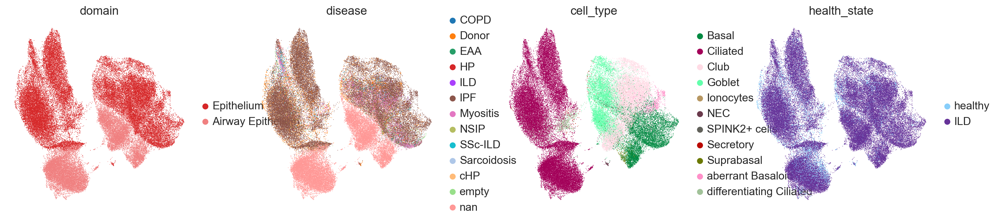

In [12]:
sc.pl.umap(ipf, color=['domain', 'disease', 'cell_type', 'health_state'])

/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/anndata/_core/merge.py:942: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


combined adata of shape: (291550, 1993)


/tmp/ipykernel_2737385/3254259363.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  full.obs["responsive_scanvi"][covid_idx] = adata.obs[labels_key]
2023-02-17 11:12:25.752326: E external/org_tensorflow/tensorflow/stream_executor/cuda/cuda_driver.cc:265] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected


INFO     Training for 10 epochs.                                                             


/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/torchmetrics/utilities/prints.py:36: UserWarning: Torchmetrics v0.9 introduced a new argument class property called `full_state_update` that has
                not been set for this class (ElboMetric). The property determines if `update` by
                default needs access to the full metric state. If this is not the case, significant speedups can be
                achieved and we recommend setting this to `False`.
                We provide an checking function
                `from torchmetrics.utilities import check_forward_full_state_property`
                that can be used to check if the `full_state_update=True` (old and potential slower behaviour,
                default for now) or if `full_state_update=False` can be used safely.
                
  warnings.warn(*args, **kwargs)
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs


Epoch 10/10: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [15:17<00:00, 91.76s/it, loss=1.2e+03, v_num=1]


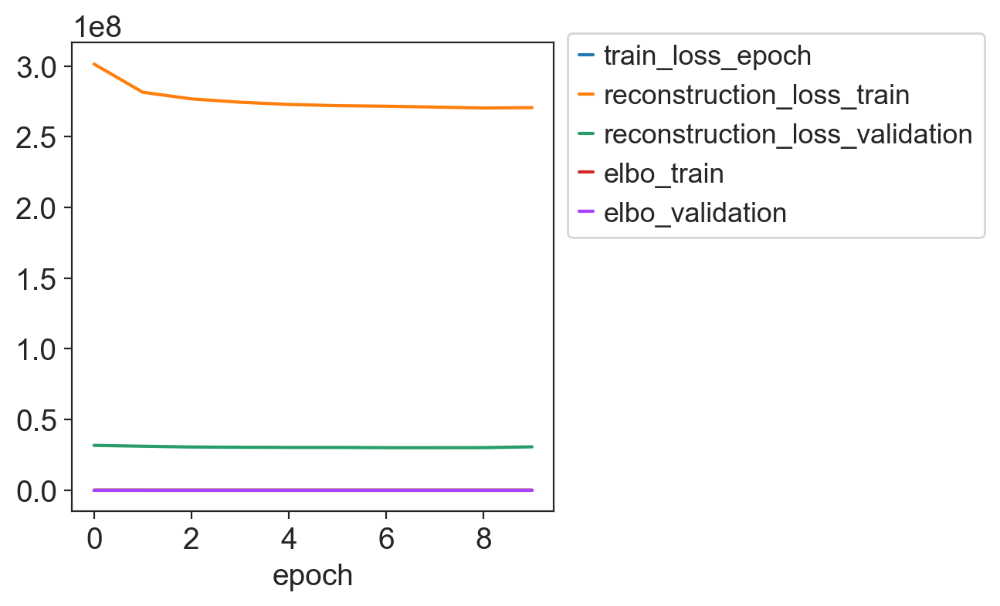

In [13]:
lvae_lr, full = run_scanvi_on_gene_subset(adata, ipf, 'data_set', 'leiden')

In [85]:
lvae_lr.save('2302_scanvi_resposive_clusters_IPF_map', overwrite=True, save_anndata=False)

In [14]:
full.obs["resp_predicted"] = lvae_lr.predict(full)
full.obsm["X_scANVI"] = lvae_lr.get_latent_representation(full)

In [15]:
%%time
sc.pp.neighbors(full, use_rep="X_scANVI")
sc.tl.umap(full)

CPU times: user 24min 56s, sys: 12min 48s, total: 37min 44s
Wall time: 2min 38s


/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


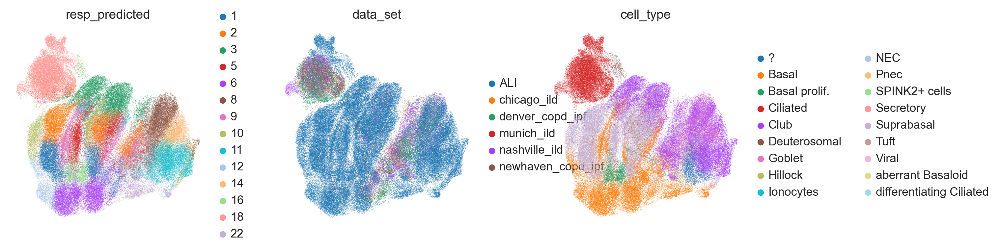

In [16]:
sc.pl.umap(full, color=['resp_predicted', 'data_set', 'cell_type'])

### aggregate score per condition

Transfer label via knn.

In [19]:
%%time
ref_emb = ad.AnnData(X=full[full.obs.source != 'IPF'].obsm["X_scANVI"], obs=full[full.obs.source != 'IPF'].obs)
ref_emb.obs['leiden'] = adata.obs.leiden
sc.pp.neighbors(ref_emb)

CPU times: user 1min 26s, sys: 1min 45s, total: 3min 11s
Wall time: 21.8 s


In [20]:
query_emb = ad.AnnData(X=full[full.obs.source == 'IPF'].obsm["X_scANVI"], obs=full[full.obs.source == 'IPF'].obs)

In [21]:
perform_label_transfer(ref_emb, query_emb, 'leiden')

Storing transferred labels in your query adata under .obs column: transf_leiden
Storing label transfer uncertainties in your query adata under .obs column: transf_leiden_unc


In [22]:
ipf.obs['transf_leiden'] = query_emb.obs['transf_leiden']

Examine scores across cell types.

In [129]:
df = pd.crosstab([ipf.obs.health_state, ipf.obs.cell_type], ipf.obs.transf_leiden)
# drop anything with fewer than 100 cells
non_rare_cell_types = ipf.obs.cell_type.value_counts()[ipf.obs.cell_type.value_counts() > 100].index
df = df.loc[(slice(None), non_rare_cell_types), :]
# normalize
df = df.divide(df.sum(1), axis=0)[resp_clusters]
df

,transf_leiden,19,22
health_state,cell_type,,
healthy,Ciliated,0.000000,0.000000
ILD,Ciliated,0.000000,0.000000
healthy,Club,0.006826,0.006826
ILD,Club,0.030568,0.011771
healthy,Basal,0.015123,0.094518
ILD,Basal,0.016469,0.070368
healthy,Goblet,0.002587,0.000000
ILD,Goblet,0.026829,0.001694
healthy,differentiating Ciliated,0.000000,0.000000


In [130]:
df = pd.concat([
    df['19'].unstack().dropna(axis=1).T['ILD'] - df['19'].unstack().dropna(axis=1).T['healthy'],
    df['22'].unstack().dropna(axis=1).T['ILD'] - df['22'].unstack().dropna(axis=1).T['healthy']
], axis=1)
df.columns=['19', '22']
df

,19,22
cell_type,,
Ciliated,0.000000,0.000000
Club,0.023743,0.004945
Basal,0.001346,-0.024150
Goblet,0.024241,0.001694
differentiating Ciliated,0.000934,0.000000
aberrant Basaloid,0.279992,0.080012
Secretory,0.013333,0.000000
Suprabasal,-0.011523,0.000210


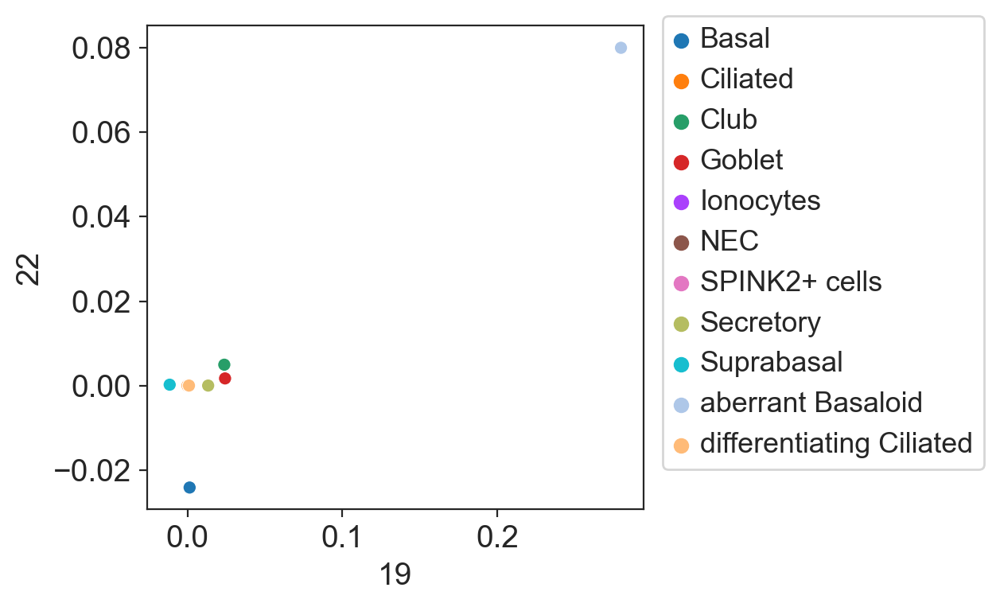

In [128]:
sns.scatterplot(
    data=df.reset_index(),
    x='19',
    y='22',
    hue='cell_type'
)
plt.legend(bbox_to_anchor=(1.01, 1.05))

/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


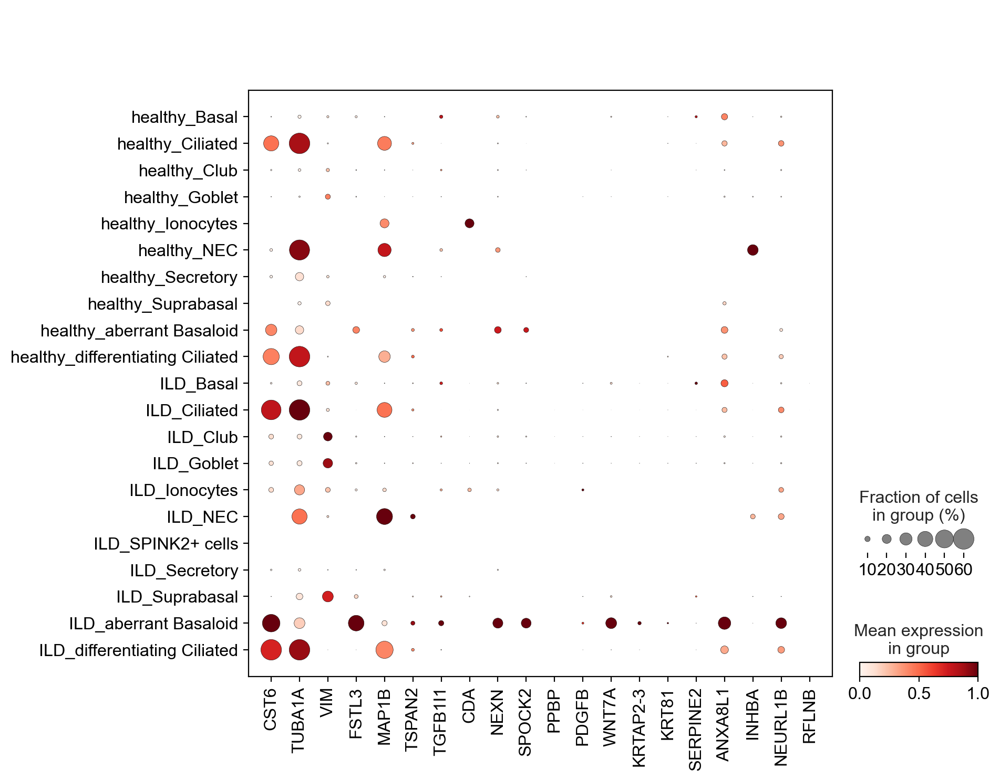

In [64]:
sc.pl.dotplot(ipf, groupby=['health_state', 'cell_type'], var_names=genes[:20], standard_scale='var', dot_max=.6)

## integrate with Fischer

In [10]:
fischer = sc.read('2302_Fischer_epithelial_only.h5ad')
fischer = fischer[~fischer.obs.cell_type.isin(['AT2, AT1 cells', 'Squamous epithelial'])]
adata = sc.read('2301_annot_patient_integrated_ambient_removed.h5ad')

In [11]:
adata.obs['source'] = 'ALI'
adata.obs['data_set'] = 'ALI'
fischer.obs['source'] = 'IPF'

/tmp/ipykernel_1895726/150409212.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  fischer.obs['source'] = 'IPF'


/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


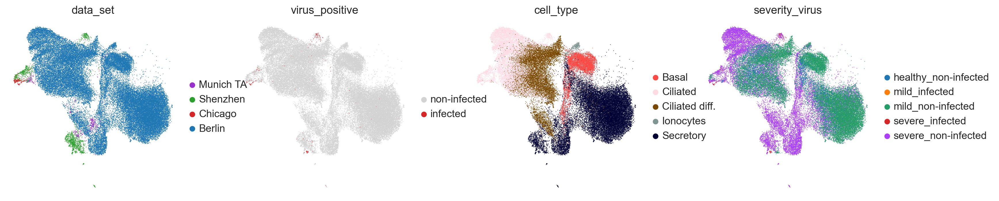

In [61]:
sc.pl.umap(fischer, color=['data_set', 'virus_positive', 'cell_type', 'severity_virus'])

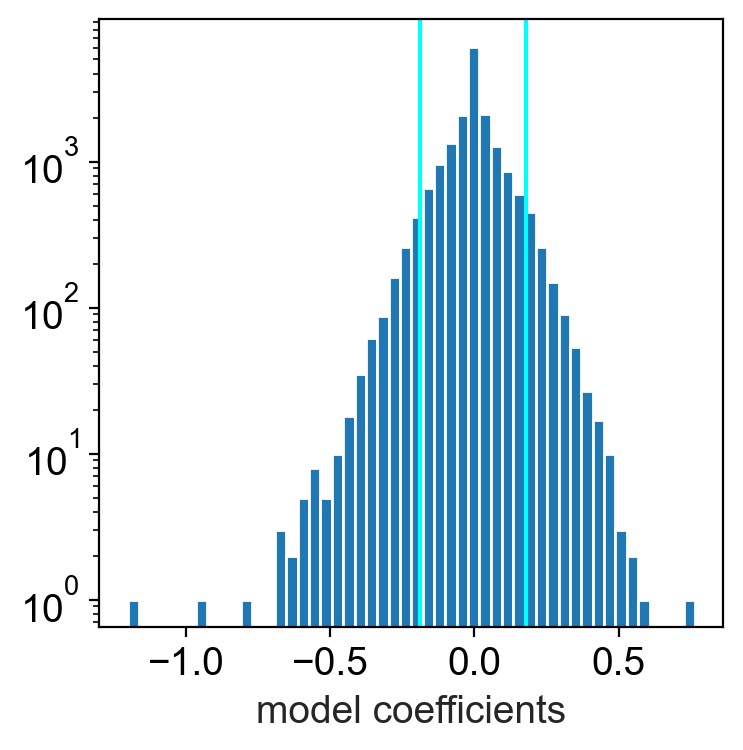

In [12]:
define_marker_genes(adata, clf, n_markers=2000)

combined adata of shape: (279833, 1993)


/tmp/ipykernel_1895726/3364385091.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  full.obs["responsive_scanvi"][covid_idx] = adata.obs[labels_key]


INFO     Training for 10 epochs.                                                             


/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/torchmetrics/utilities/prints.py:36: UserWarning: Torchmetrics v0.9 introduced a new argument class property called `full_state_update` that has
                not been set for this class (ElboMetric). The property determines if `update` by
                default needs access to the full metric state. If this is not the case, significant speedups can be
                achieved and we recommend setting this to `False`.
                We provide an checking function
                `from torchmetrics.utilities import check_forward_full_state_property`
                that can be used to check if the `full_state_update=True` (old and potential slower behaviour,
                default for now) or if `full_state_update=False` can be used safely.
                
  warnings.warn(*args, **kwargs)
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs


Epoch 10/10: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [12:31<00:00, 75.19s/it, loss=1.26e+03, v_num=1]


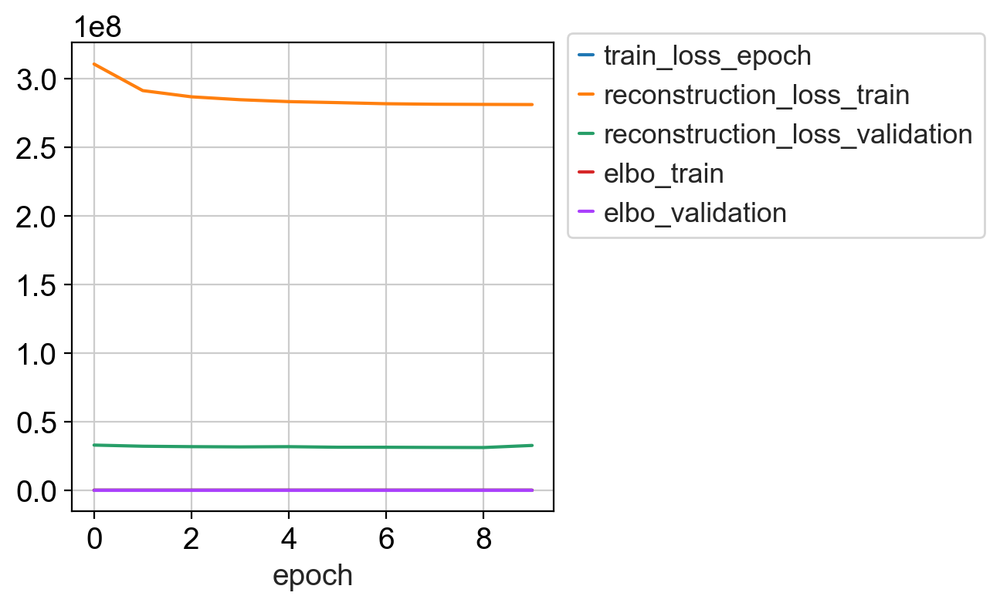

In [92]:
lvae_lr, full = run_scanvi_on_gene_subset(adata, fischer, 'data_set', 'leiden')

In [93]:
lvae_lr.save('2302_scanvi_resposive_clusters_fischer_map', overwrite=True, save_anndata=False)

Reload:

In [88]:
lvae_lr, full = run_scanvi_on_gene_subset(adata, fischer, 'data_set', 'leiden', train=False)
lvae_lr.load('2302_scanvi_resposive_clusters_fischer_map', full)
lvae_lr.is_trained = True

combined adata of shape: (279833, 1993)


/tmp/ipykernel_1895726/3364385091.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  full.obs["responsive_scanvi"][covid_idx] = adata.obs[labels_key]


INFO     File 2302_scanvi_resposive_clusters_fischer_map/model.pt already downloaded         


/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scvi/model/base/_utils.py:134: UserWarning: var_names for adata passed in does not match var_names of adata used to train the model. For valid results, the vars need to be the same and in the same order as the adata used to train the model.
  warnings.warn(


In [94]:
full.obs["resp_predicted"] = lvae_lr.predict(full)
full.obsm["X_scANVI"] = lvae_lr.get_latent_representation(full)

In [95]:
%%time
sc.pp.neighbors(full, use_rep="X_scANVI")
sc.tl.umap(full)

CPU times: user 23min 6s, sys: 10min 25s, total: 33min 32s
Wall time: 2min 24s


/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


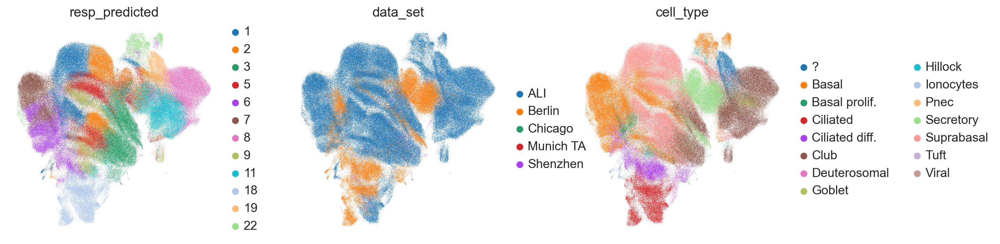

In [96]:
sc.pl.umap(full, color=['resp_predicted', 'data_set', 'cell_type'])

In [97]:
%%time
ref_emb = ad.AnnData(X=full[full.obs.data_set == 'ALI'].obsm["X_scANVI"], obs=full[full.obs.data_set == 'ALI'].obs)
ref_emb.obs['leiden'] = adata.obs.leiden
sc.pp.neighbors(ref_emb)

CPU times: user 1min 26s, sys: 2min 10s, total: 3min 36s
Wall time: 21.2 s


In [98]:
query_emb = ad.AnnData(X=full[full.obs.data_set != 'ALI'].obsm["X_scANVI"], obs=full[full.obs.data_set != 'ALI'].obs)
perform_label_transfer(ref_emb, query_emb, 'leiden')

Storing transferred labels in your query adata under .obs column: transf_leiden
Storing label transfer uncertainties in your query adata under .obs column: transf_leiden_unc


In [99]:
fischer.obs['transf_leiden'] = query_emb.obs['transf_leiden']

Examine scores across patient status.

<AxesSubplot: xlabel='19', ylabel='cell_type'>

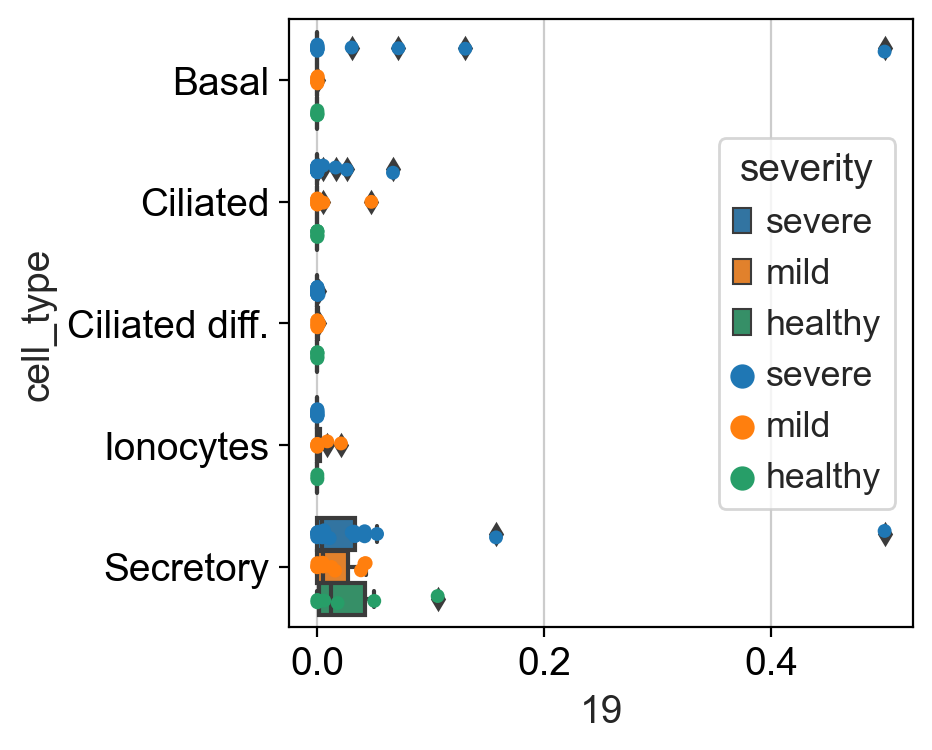

In [103]:
df = pd.crosstab([fischer.obs.cell_type, fischer.obs.patients], fischer.obs.transf_leiden)
# normalize
df = df.divide(df.sum(1), axis=0)[resp_clusters].reset_index('cell_type')
df['severity'] = df.index.map(dict(zip(fischer.obs.patients, fischer.obs.severity)))

sns.boxplot(data=df, x='19', y='cell_type', hue='severity')
sns.stripplot(data=df, x='19', y='cell_type', hue='severity', dodge=True)

<AxesSubplot: xlabel='22', ylabel='cell_type'>

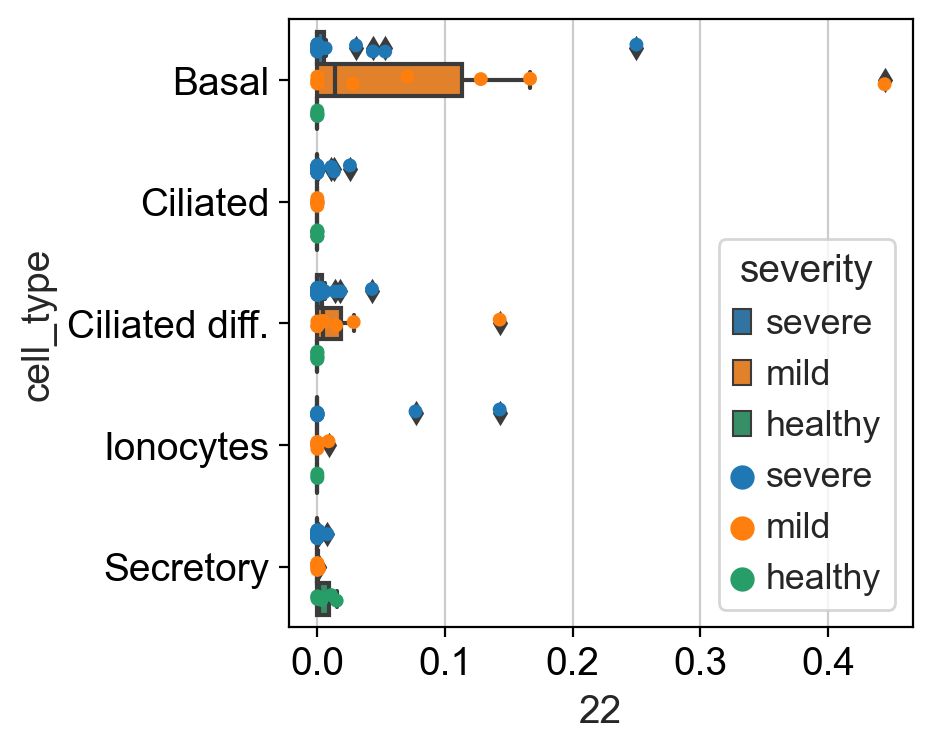

In [104]:
sns.boxplot(data=df, x='22', y='cell_type', hue='severity')
sns.stripplot(data=df, x='22', y='cell_type', hue='severity', dodge=True)

/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


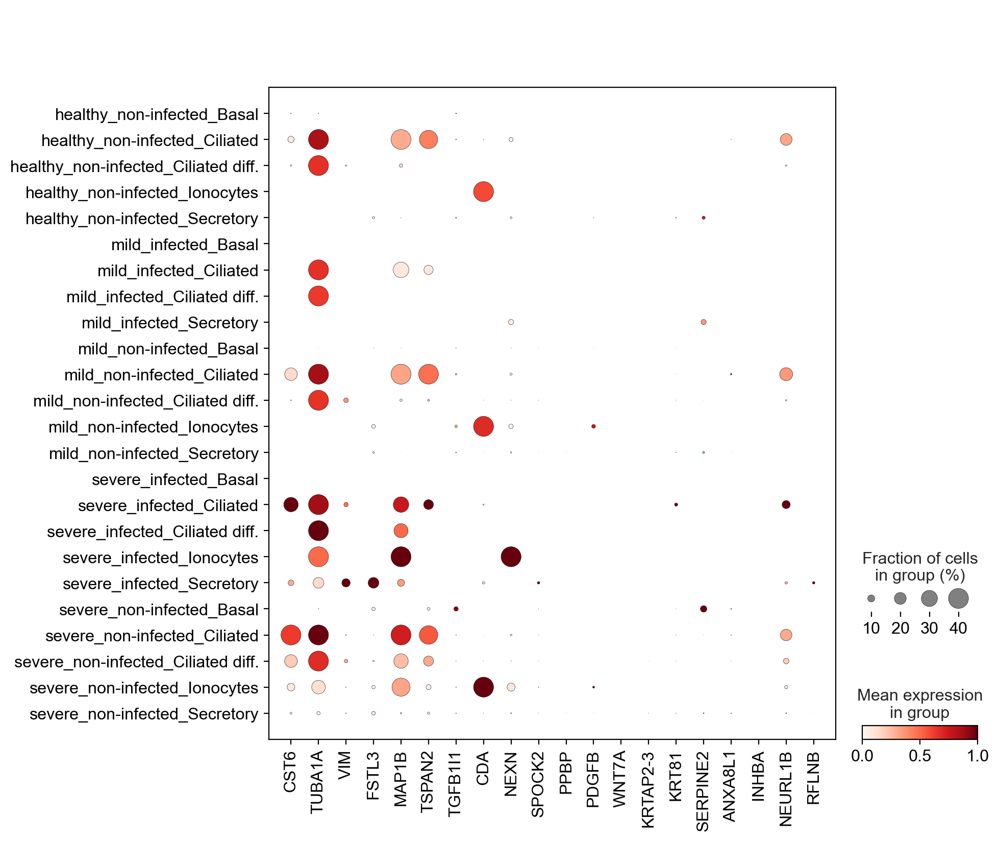

In [106]:
sc.pl.dotplot(fischer, groupby=['severity_virus', 'cell_type'], var_names=genes[:20], standard_scale='var', dot_max=.4)

This doesn't work because these genes are also upregulated in the ciliated cells in this dataset, so agnostic scoring just highlights ciliated cells...

In [79]:
sc.tl.score_genes(fischer, gene_list=genes[2:20])

/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


In [108]:
df = fischer.obs[['score', 'patients', 'severity', 'cell_type']].groupby(['patients', 'cell_type']).agg({'score':'mean', 'severity':'first'}).reset_index('cell_type')

<AxesSubplot: xlabel='score', ylabel='cell_type'>

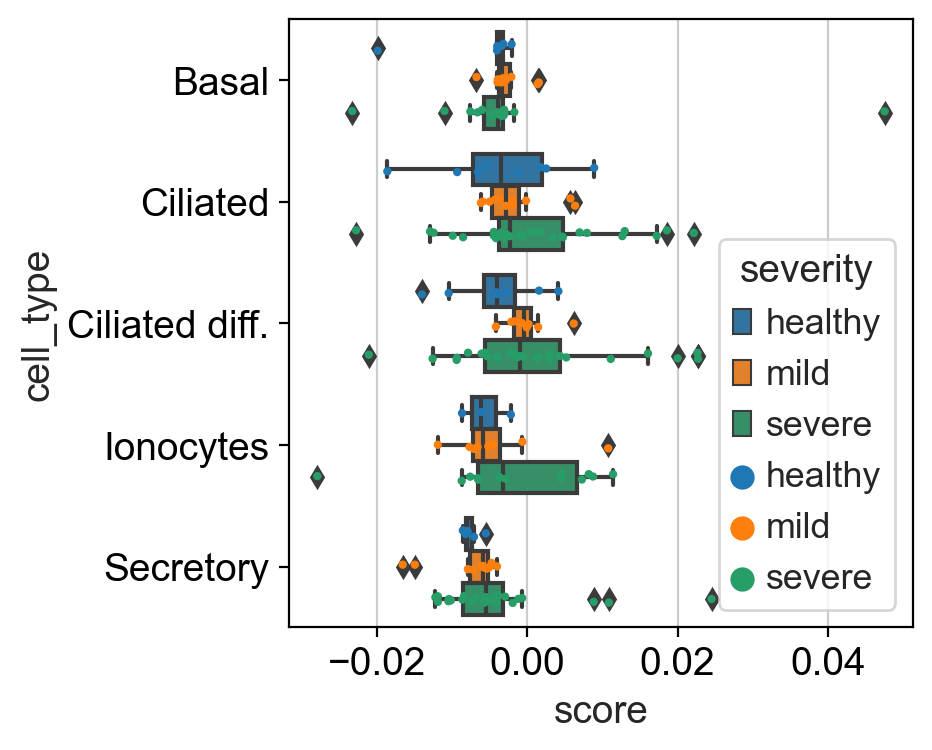

In [109]:
sns.boxplot(data=df, x='score', y='cell_type', hue='severity')
sns.stripplot(data=df, x='score', y='cell_type', hue='severity', dodge=True, size=3)

/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


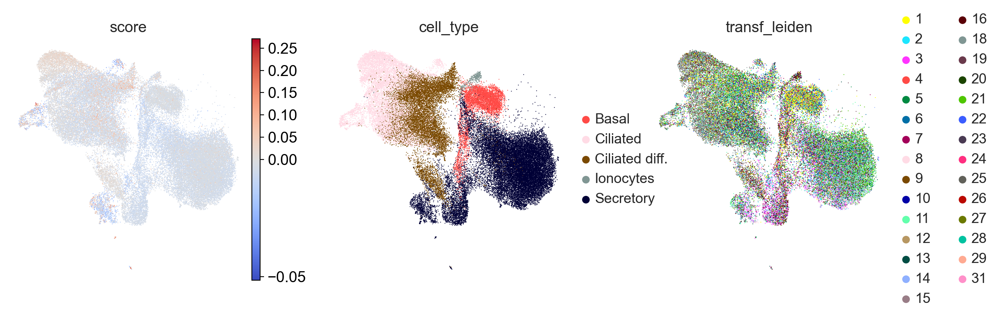

In [82]:
sc.pl.umap(fischer, color=['score', 'cell_type', 'transf_leiden'], cmap='coolwarm', vcenter=0)